<a href="https://colab.research.google.com/github/gecco-evojax/evojax/blob/main/notebooks/MultiAgentsWaterWorld.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Fri Jan  7 04:10:34 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.46       Driver Version: 495.46       CUDA Version: 11.5     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    36W / 300W |      0MiB / 16160MiB |      4%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
# @title Install Packages

from IPython.display import clear_output

!pip install git+https://github.com/gecco-evojax/evojax.git@main

clear_output()

In [3]:
# @title Import Libraries

import time
import numpy as np
from IPython.display import Image

import jax
import jax.numpy as jnp
from jax import random

from evojax import Trainer
from evojax.algo import PGPE
from evojax.policy import MLPPolicy
from evojax.task.ma_waterworld import MultiAgentWaterWorld
from evojax.util import create_logger

log_dir = '/tmp/ma_water_world'
logger = create_logger(name='MultiAgentsWaterWorldDemo', log_dir=log_dir)
logger.info('jax.devices(): {}'.format(jax.devices()))

absl: 2022-01-07 04:10:40,330 [INFO] Starting the local TPU driver.
absl: 2022-01-07 04:10:40,332 [INFO] Unable to initialize backend 'tpu_driver': Not found: Unable to find driver in registry given worker: local://
absl: 2022-01-07 04:10:41,371 [INFO] Unable to initialize backend 'tpu': Invalid argument: TpuPlatform is not available.
MultiAgentsWaterWorldDemo: 2022-01-07 04:10:41,372 [INFO] jax.devices(): [GpuDevice(id=0, process_index=0)]


total_reward=[ 1.  1.  3.  2.  0. -1. -3.  1.  0.  0.  1. -3.  0.  3.  7. -3.]


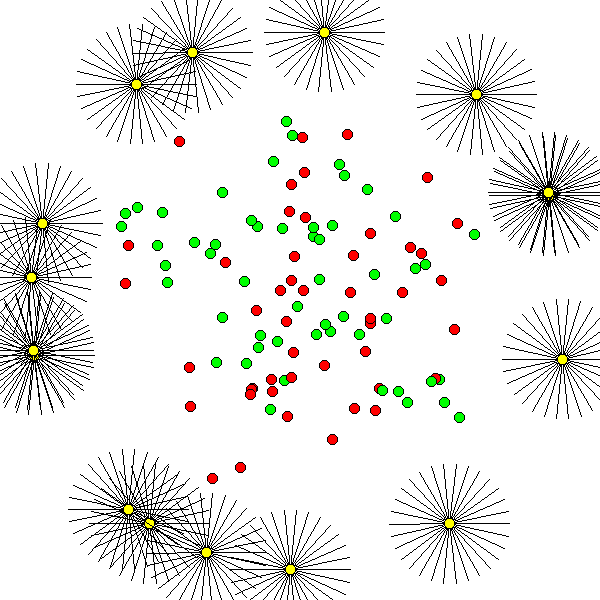

In [4]:
# @title Preview of the task
# @markdown This can take some time because it involves rendering.

max_steps = 500
num_agents = 16

train_env = MultiAgentWaterWorld(
    num_agents=num_agents, max_steps=max_steps, test=False)
valid_env = MultiAgentWaterWorld(
    num_agents=num_agents, max_steps=max_steps, test=True)

reset_fn = jax.jit(valid_env.reset)
step_fn = jax.jit(valid_env.step)

key = random.PRNGKey(0)
state = reset_fn(key[None, :])
total_reward = 0
screens = []
action = jnp.ones((1, num_agents, 4)) * 0.25
for _ in range(max_steps):
    state, reward, done = step_fn(state, action)
    total_reward = total_reward + reward
    screens.append(MultiAgentWaterWorld.render(state))
print('total_reward={}'.format(total_reward[0]))
screens[0].save('ma_waterworld_rand_policy.gif', save_all=True,
                append_images=screens[2::2], duration=40, loop=0)
Image(open('ma_waterworld_rand_policy.gif','rb').read())

# Learning to solve the task

In [13]:
# @title Set hyper-parameters

center_lr = 0.021  # @param
stdev_lr = 0.004  # @param
init_stdev = 0.056  # @param
max_iter = 3000  # @param
seed = 42  # @param
n_repeats =   64# @param

In [14]:
# @title Training

policy = MLPPolicy(
    input_dim=train_env.obs_shape[-1],
    output_dim=train_env.act_shape[-1],
    hidden_dims=[100, ],
    output_act_fn='softmax',
)

solver = PGPE(
    pop_size=num_agents,
    param_size=policy.num_params,
    optimizer='adam',
    center_learning_rate=center_lr,
    init_stdev=init_stdev,
    stdev_learning_rate=stdev_lr,
    seed=seed,
)

# For multi-agent training,
#   pop_size: number of agents in training tasks
#   n_evalutions: number of agents in test tasks
#   n_repeats: parameter evaluation repetion in training
#   test_n_repeats: parameter evalution repetition in test
trainer = Trainer(
    policy=policy,
    solver=solver,
    train_task=train_env,
    test_task=valid_env,
    max_iter=max_iter,
    log_interval=10,
    test_interval=50,
    n_repeats=n_repeats,
    test_n_repeats=100,
    n_evaluations=num_agents,
    seed=seed,
    log_dir=log_dir,
    logger=logger,
    normalize_obs=False,
)
_ = trainer.run()

MLPPolicy: 2022-01-07 05:23:42,359 [INFO] MLPPolicy.num_params = 15704
MultiAgentsWaterWorldDemo: 2022-01-07 05:23:42,438 [INFO] Start to train for 3000 iterations.
MultiAgentsWaterWorldDemo: 2022-01-07 05:25:27,614 [INFO] Iter=10, size=16, max=0.4375, avg=0.0986, min=-0.2188, std=0.2317
MultiAgentsWaterWorldDemo: 2022-01-07 05:25:35,432 [INFO] Iter=20, size=16, max=0.2969, avg=-0.0732, min=-0.4688, std=0.1940
MultiAgentsWaterWorldDemo: 2022-01-07 05:25:43,534 [INFO] Iter=30, size=16, max=0.5469, avg=0.1289, min=-0.1406, std=0.1715
MultiAgentsWaterWorldDemo: 2022-01-07 05:25:51,384 [INFO] Iter=40, size=16, max=0.5312, avg=0.0381, min=-0.4219, std=0.2454
MultiAgentsWaterWorldDemo: 2022-01-07 05:25:59,072 [INFO] Iter=50, size=16, max=0.6562, avg=0.1543, min=-0.4062, std=0.2933
MultiAgentsWaterWorldDemo: 2022-01-07 05:26:47,822 [INFO] [TEST] Iter=50, #tests=16, max=0.5100 avg=0.2688, min=-0.0700, std=0.1696
MultiAgentsWaterWorldDemo: 2022-01-07 05:26:55,187 [INFO] Iter=60, size=16, max=0.

total_reward=[-1.  1.  3.  3.  0.  2.  5.  2.  4. -1.  3.  2.  7.  1.  0.  3.]


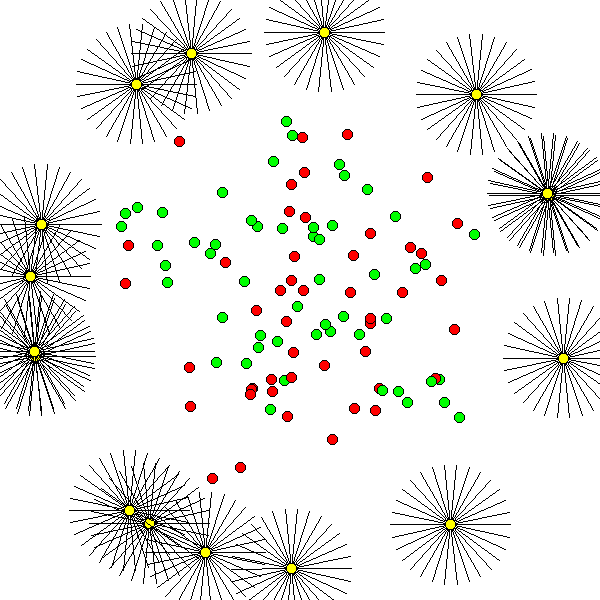

In [15]:
# @title Visualzie the trained policy

action_fn = jax.jit(policy.get_actions)
best_params = jnp.repeat(solver.best_params[None, :], num_agents, axis=0)

key = random.PRNGKey(0)
state = reset_fn(key[None, :])
total_reward = 0
screens = []
for _ in range(max_steps):
    obs = state.obs.reshape((-1, *state.obs.shape[2:]))
    action = action_fn(obs, best_params)
    action = action.reshape(
        state.obs.shape[0], state.obs.shape[1], *action.shape[1:])
    state, reward, done = step_fn(state, action)
    total_reward = total_reward + reward
    screens.append(MultiAgentWaterWorld.render(state))
print('total_reward={}'.format(total_reward[0]))
screens[0].save('ma_waterworld_trained_policy.gif', save_all=True,
                append_images=screens[2::2], duration=40, loop=0)
Image(open('ma_waterworld_trained_policy.gif','rb').read())